# Load the data

We will load the Amazon reviews from 5 channels

In [16]:
import pandas as pd
from glob import glob

files = glob("../../data/*")
print(files)

['../../data/Appliances.jsonl.gz', '../../data/Amazon_Fashion.jsonl.gz', '../../data/All_Beauty.jsonl.gz', '../../data/data_cleaned.parquet']


In [17]:
df0 = pd.read_json(files[0], lines=True )
df0 = df0[['rating', 'text']]
df0['cat'] = files[0].split('.')[-3].split('/')[-1]
df1 = pd.read_json(files[1], lines=True )
df1 = df1[['rating', 'text']]
df1['cat'] = files[1].split('.')[-3].split('/')[-1]
df2 = pd.read_json(files[2], lines=True )
df2 = df2[['rating', 'text']]
df2['cat'] = files[2].split('.')[-3].split('/')[-1]

df = pd.concat([df0, df1, df2])

del df0, df1, df2

print(df.shape)
display(df.head())

(5331072, 3)


,rating,text,cat
0,5,work great. use a new one every month,Appliances
1,5,Little on the thin side,Appliances
2,5,"Quick delivery, fixed the issue!",Appliances
3,5,I wasn't sure whether these were worth it or n...,Appliances
4,5,Easy to install got the product expected to re...,Appliances


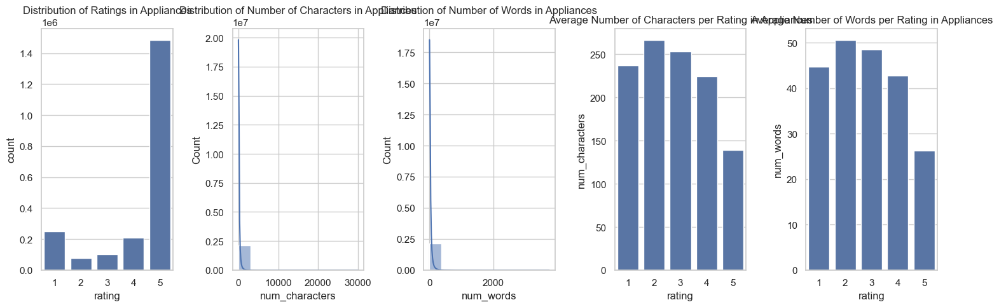

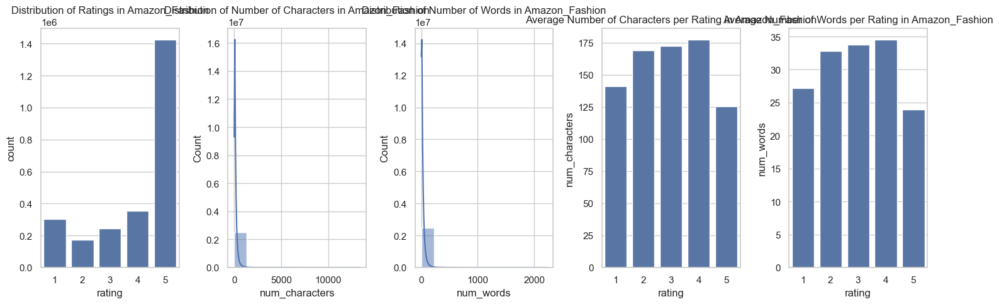

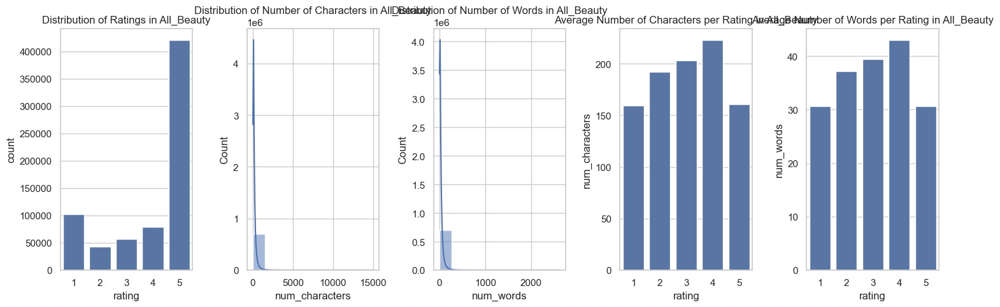

In [18]:
df['num_characters'] = [len(t) for t in df.text.values]
df['num_words'] = [len(t.split(' ')) for t in df.text.values]

import matplotlib.pyplot as plt
import seaborn as sns

# Set the style for the plots
sns.set(style="whitegrid")

# For each category, the distribution of ratings, number of characters, and number of words
categories = df['cat'].unique()

for category in categories:
    subset = df[df['cat'] == category]
    
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 5, 1)
    sns.countplot(x='rating', data=subset)
    plt.title(f'Distribution of Ratings in {category}')
    
    plt.subplot(1, 5, 2)
    sns.histplot(subset['num_characters'], bins=10, kde=True)
    plt.title(f'Distribution of Number of Characters in {category}')
    
    plt.subplot(1, 5, 3)
    sns.histplot(subset['num_words'], bins=10, kde=True)
    plt.title(f'Distribution of Number of Words in {category}')

    plt.subplot(1, 5, 4) 
    sns.barplot(x='rating', y='num_characters', data=subset, errorbar=None) 
    plt.title(f'Average Number of Characters per Rating in {category}') 
    
    plt.subplot(1, 5, 5) 
    sns.barplot(x='rating', y='num_words', data=subset, errorbar=None) 
    plt.title(f'Average Number of Words per Rating in {category}')
    
    plt.tight_layout()
    plt.show()



*Some findings here*:
1. Ratings 2 and 3 are the most few ratings, 
2. They are also the ones with the most number of characters and words
3. Rating 5 is the most frequent rating in all categories, but has the least amount of word and character count

In [19]:
# wnl.lemmatize("didn't")
# pos_tag(word_tokenize("didn't"))
# "didn't" in stop_words

In [20]:
from tqdm import tqdm
from multiprocessing import Pool
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from collections import Counter
from wordcloud import WordCloud
from text_lemmatizer_mp import preprocess_text

# nltk.download('stopwords')
# stop_words = set(stopwords.words('english'))

# nltk.download('wordnet')

# from nltk.corpus import wordnet
# from nltk.stem import WordNetLemmatizer
# from nltk import pos_tag, word_tokenize

# def get_wordnet_pos(treebank_tag):
#     if treebank_tag.startswith('J'):
#         return wordnet.ADJ
#     elif treebank_tag.startswith('V'):
#         return wordnet.VERB
#     elif treebank_tag.startswith('N'):
#         return wordnet.NOUN
#     elif treebank_tag.startswith('R'):
#         return wordnet.ADV
#     else:
#         return None

# lemmatizer = WordNetLemmatizer()

# nltk.download('punkt_tab')
# nltk.download('averaged_perceptron_tagger_eng')

# def preprocess_text(text):
#     # tokens = word_tokenize(text)
#     tokens = text.split()
#     tagged = pos_tag(tokens)
#     lemmatized_sentence = []
    
#     lemmatized_sentence = [
#         lemmatizer.lemmatize(word, pos=get_wordnet_pos(tag) or wordnet.NOUN)
#         for word, tag in tagged if word not in stop_words
#     ]
#     return lemmatized_sentence

def parallel_preprocess_texts(texts): 
    with Pool() as pool: 
        return list(tqdm(pool.imap(preprocess_text, texts), total=len(texts)))

categories = df['cat'].unique()
ratings = df['rating'].unique()

print("Start cleaning the review texts")

df['text_clean'] = parallel_preprocess_texts(df['text'].values)
# df['text_clean'] = [preprocess_text(t) for t in tqdm(df['text'].values, desc="Cleaning review texts")]

print("Done cleaning the review texts")


Start cleaning the review texts


  0%|          | 0/5331072 [00:00<?, ?it/s][nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data] Downloading package punkt_tab to /Users/mrla/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /Users/mrla/nltk_data...


Done cleaning the review texts


In [23]:
# df.to_parquet("../../data/data_cleaned.parquet", compression='gzip')

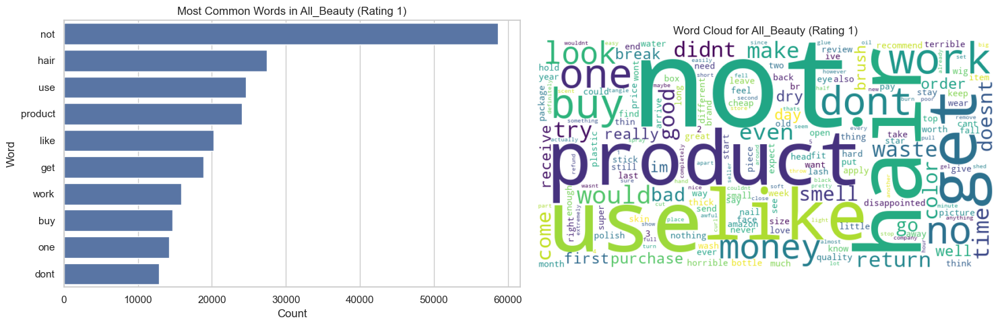

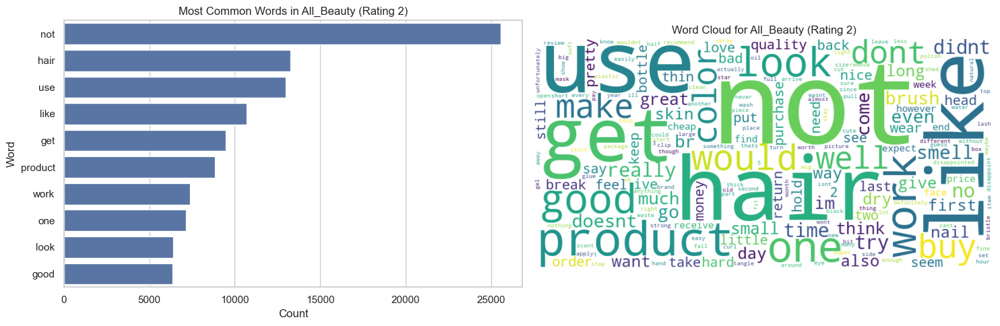

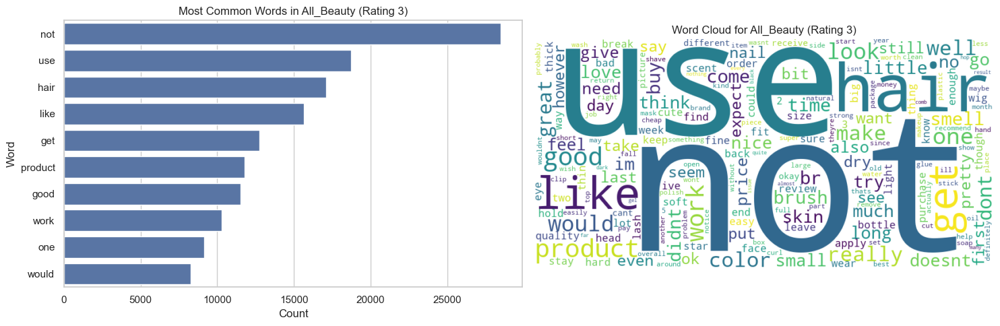

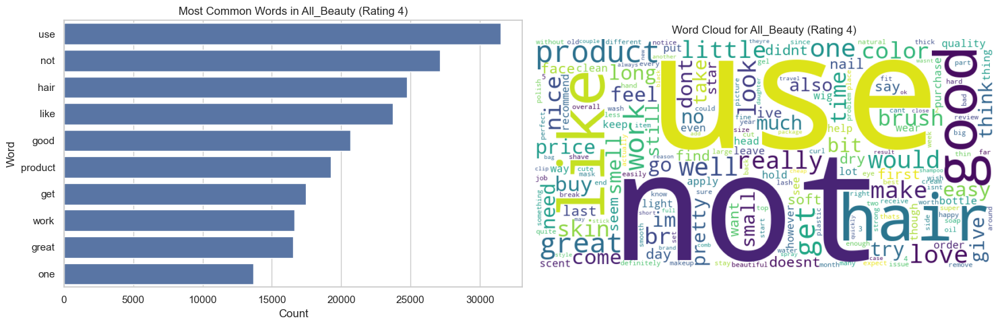

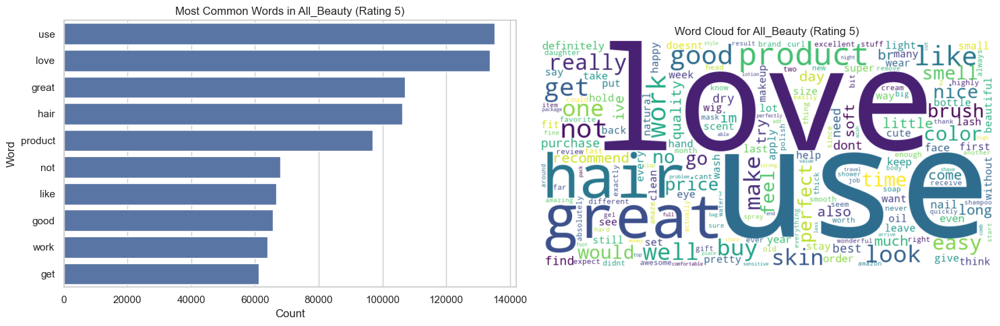

...

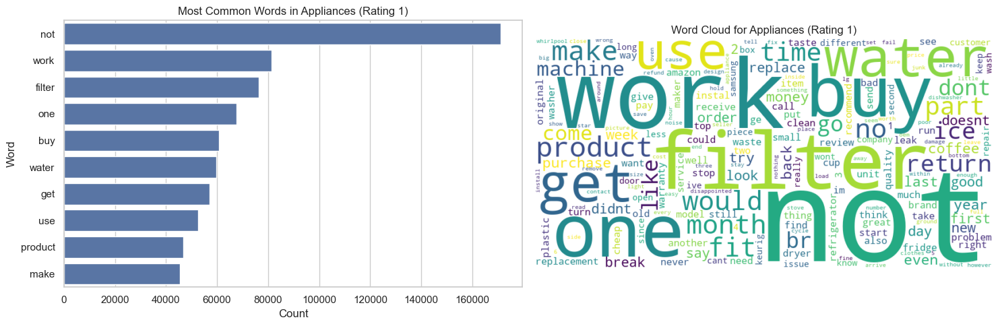

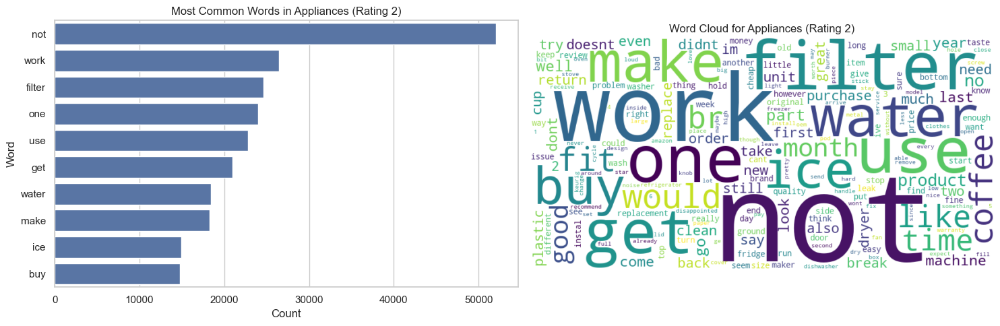

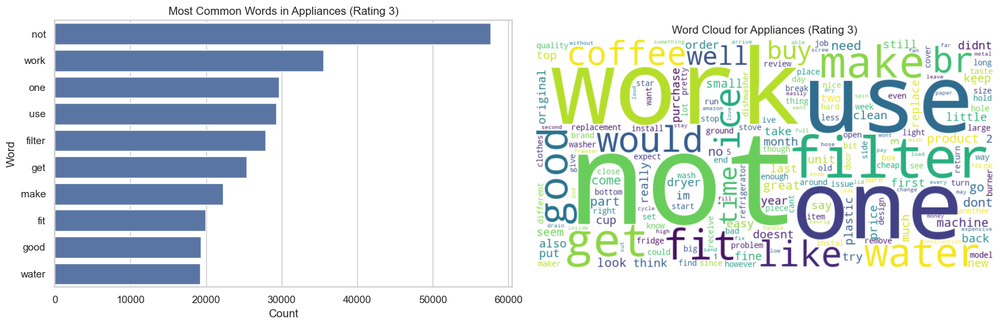

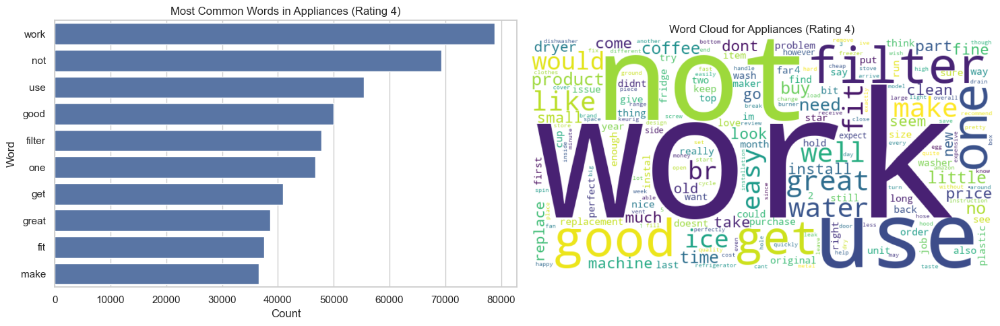

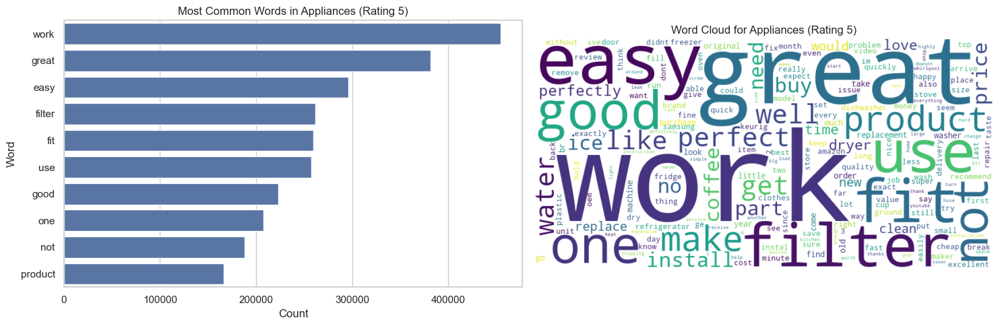

In [35]:

ratings = list(df['rating'].unique())
ratings.sort()

for category in categories:
    for rating in ratings:
        subset = df[(df['cat'] == category) & (df['rating'] == rating)]
        all_words = []
        for review_words in subset['text_clean']:
            all_words.extend(review_words)
        
        word_counts = Counter(all_words)
        common_words = word_counts.most_common(10)
        
        # Create a figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Bar Chart
        words, counts = zip(*common_words)
        sns.barplot(x=list(counts), y=list(words), ax=axes[0])
        axes[0].set_title(f'Most Common Words in {category} (Rating {rating})')
        axes[0].set_xlabel('Count')
        axes[0].set_ylabel('Word')
        
        # Word Cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
        axes[1].imshow(wordcloud, interpolation='bilinear')
        axes[1].set_title(f'Word Cloud for {category} (Rating {rating})')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()


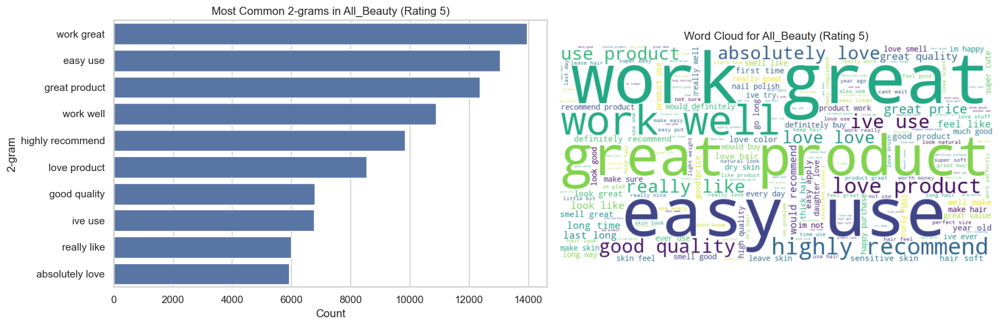

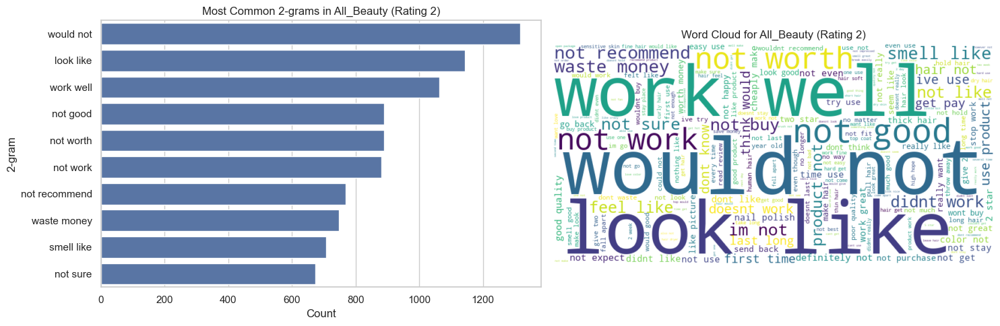

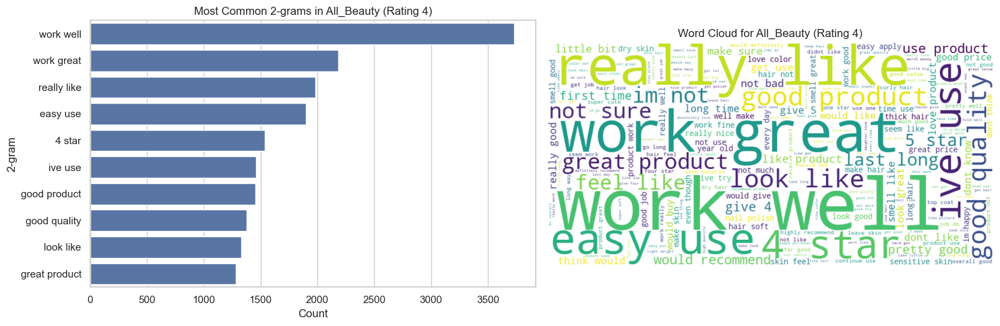

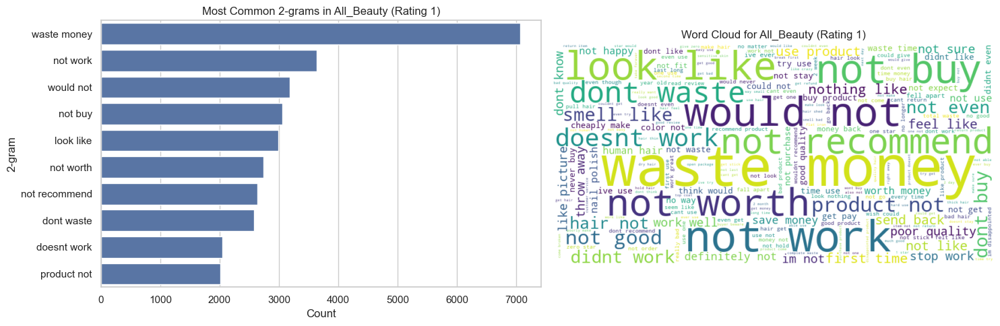

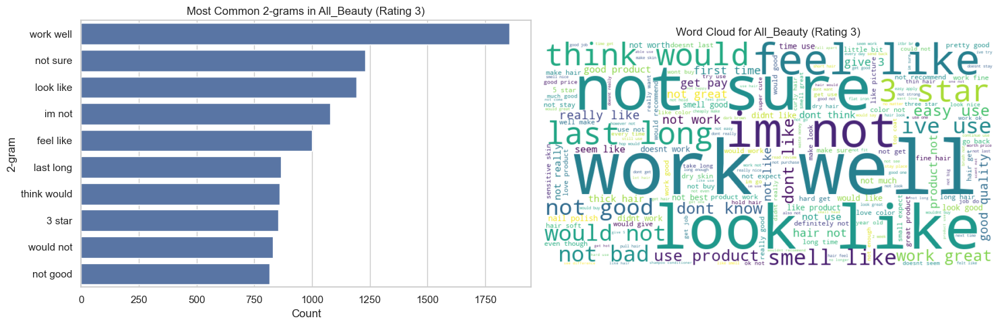

...

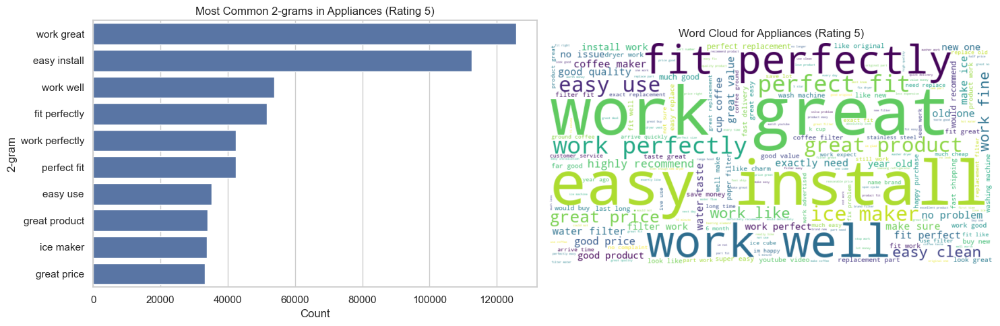

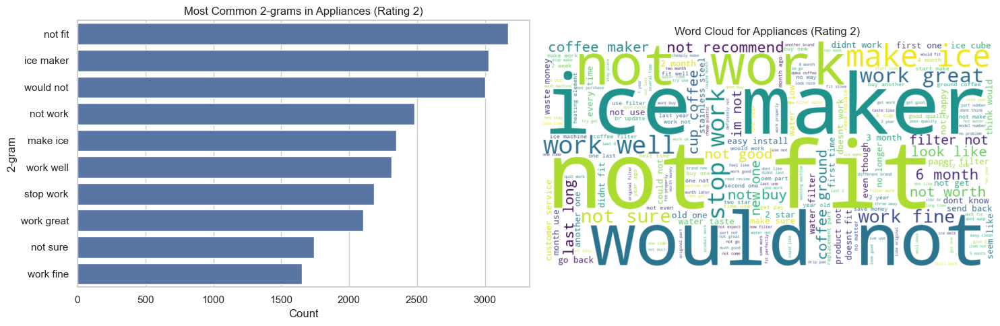

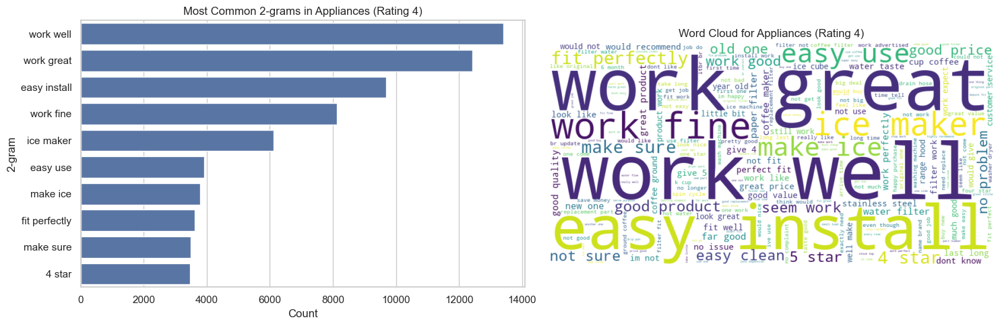

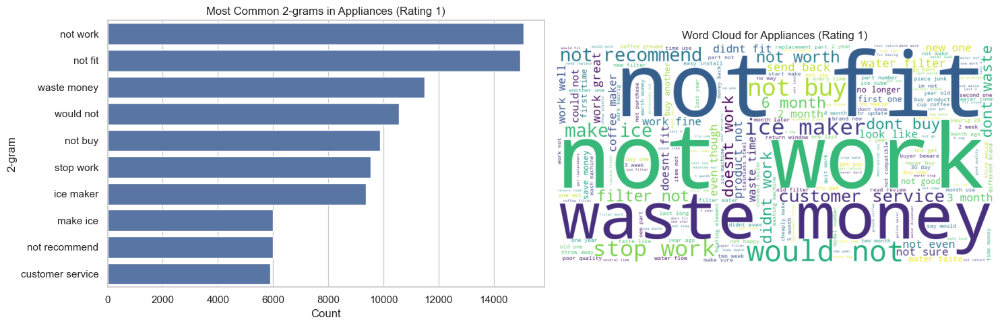

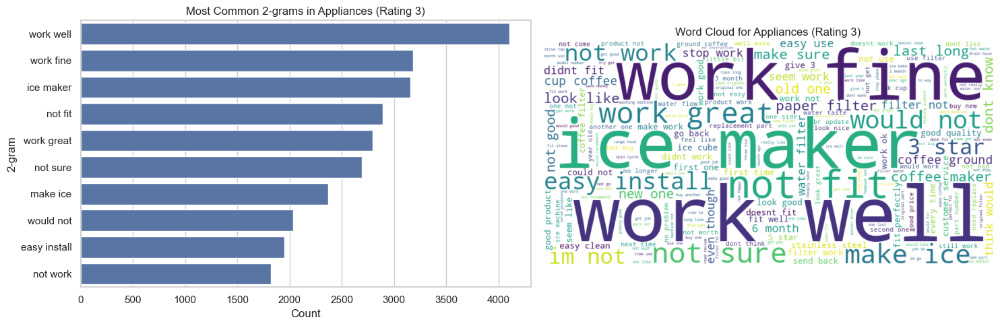

In [34]:

from nltk import ngrams

for category in categories:
    for rating in ratings:
        subset = df[(df['cat'] == category) & (df['rating'] == rating)]
        all_ngrams = []
        
        # Generate 2-grams for each review
        for review_words in subset['text_clean']:
            # Generate 2-grams from the review words
            review_ngrams = list(ngrams(review_words, 2))
            all_ngrams.extend(review_ngrams)
        
        # Count the most common 2-grams
        ngram_counts = Counter(all_ngrams)
        common_ngrams = ngram_counts.most_common(10)
        
        # Create a figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Bar Chart
        ngrams_text, counts = zip(*common_ngrams)
        ngrams_text = [' '.join(ngram) for ngram in ngrams_text]  # Convert tuples to strings
        sns.barplot(x=list(counts), y=list(ngrams_text), ax=axes[0])
        axes[0].set_title(f'Most Common 2-grams in {category} (Rating {rating})')
        axes[0].set_xlabel('Count')
        axes[0].set_ylabel('2-gram')
        
        # Convert 2-gram tuples to strings
        ngram_frequencies = {" ".join(ngram): count for ngram, count in ngram_counts.items()}

        # Generate the word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(ngram_frequencies)

        axes[1].imshow(wordcloud, interpolation='bilinear')
        axes[1].set_title(f'Word Cloud for {category} (Rating {rating})')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()


In [22]:
df.head()

,rating,text,cat,num_characters,num_words,text_clean
0,5,work great. use a new one every month,Appliances,37,8,"[work, great, use, new, one, every, month]"
1,5,Little on the thin side,Appliances,23,5,"[little, thin, side]"
2,5,"Quick delivery, fixed the issue!",Appliances,32,5,"[quick, delivery, fix, issue]"
3,5,I wasn't sure whether these were worth it or n...,Appliances,299,57,"[wasnt, sure, whether, worth, not, give, cost,..."
4,5,Easy to install got the product expected to re...,Appliances,51,9,"[easy, install, get, product, expect, receive]"


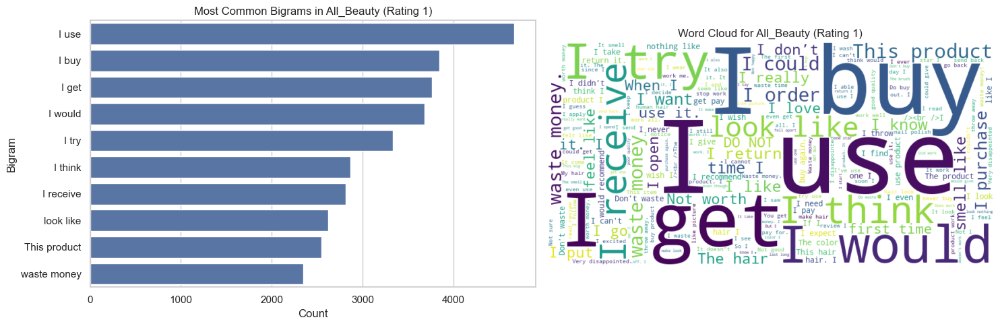

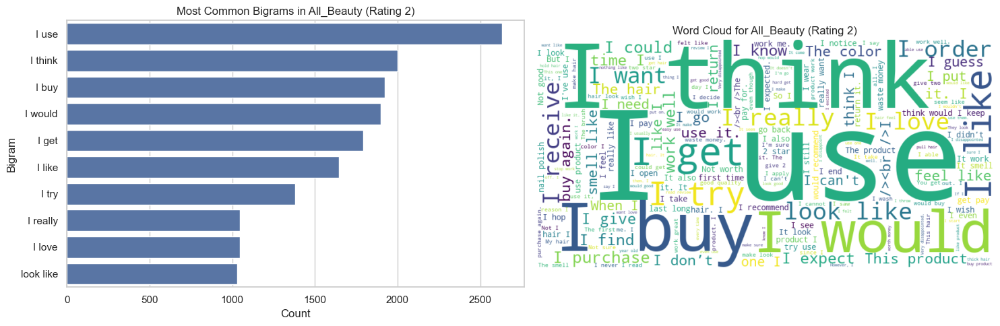

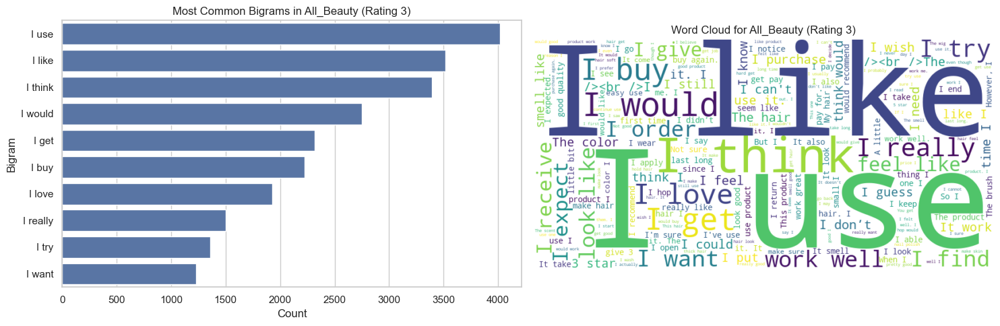

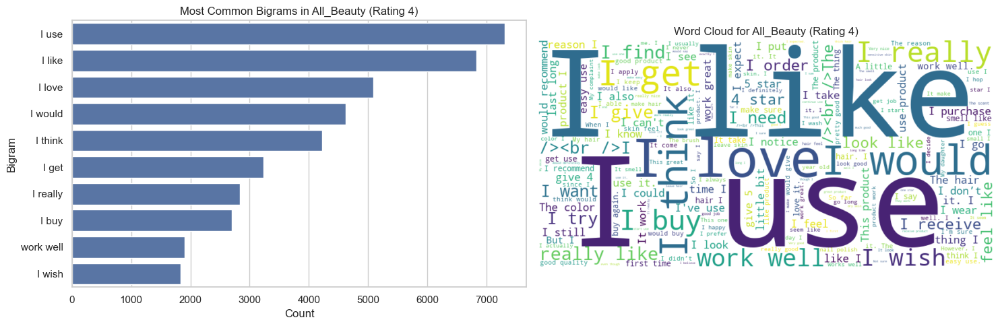

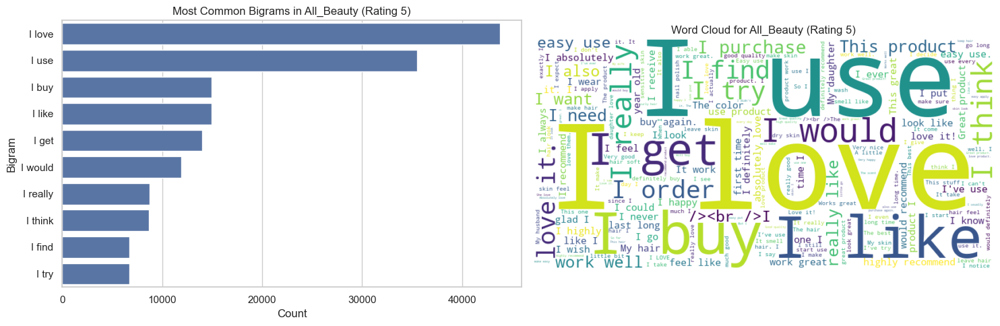

...

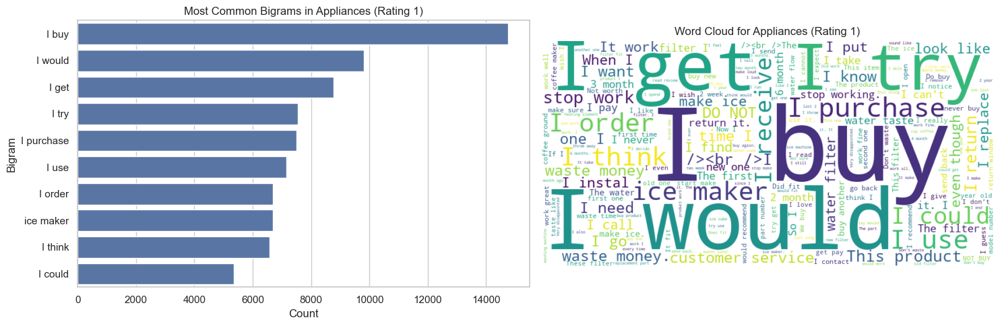

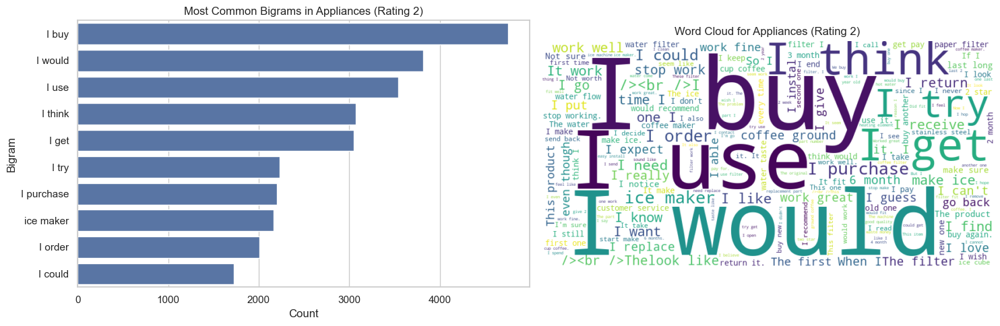

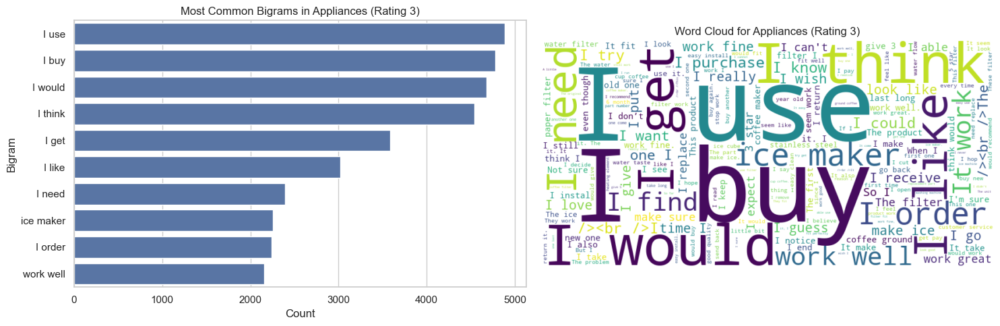

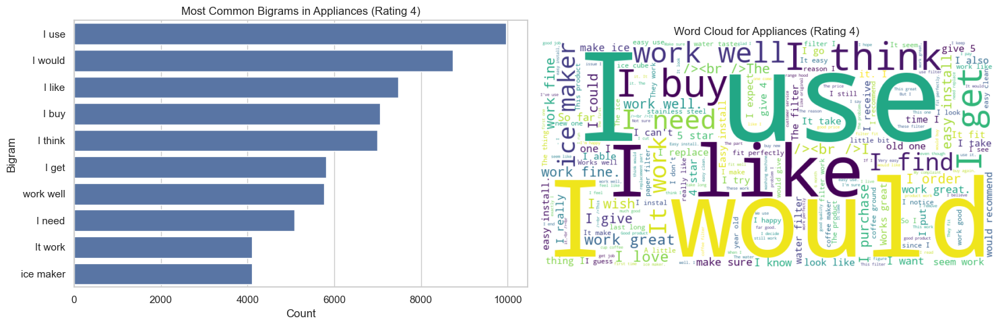

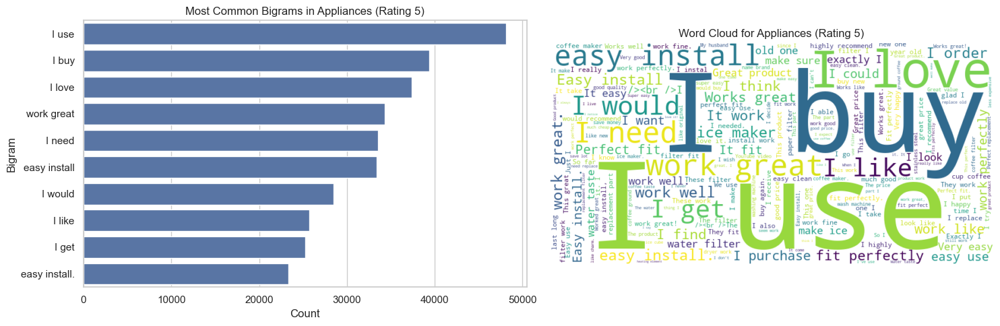

In [29]:
from nltk.util import ngrams

def generate_bigrams(words):
    bigrams = ngrams(words, 2)
    return [' '.join(bg) for bg in bigrams]


categories = list(set(list(df['cat'].unique())))
ratings = list(set(list(df['rating'].unique())))

for category in categories:
    for rating in ratings:
        subset = df[(df['cat'] == category) & (df['rating'] == rating)]
        all_bigrams = []
        for review_words in subset['text_clean']:
            bigrams = generate_bigrams(review_words)
            all_bigrams.extend(bigrams)
        
        bigram_counts = Counter(all_bigrams)
        common_bigrams = bigram_counts.most_common(10)
        
        # Create a figure with two subplots
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
        
        # Bar Chart
        bigrams, counts = zip(*common_bigrams)
        sns.barplot(x=list(counts), y=list(bigrams), ax=axes[0])
        axes[0].set_title(f'Most Common Bigrams in {category} (Rating {rating})')
        axes[0].set_xlabel('Count')
        axes[0].set_ylabel('Bigram')
        
        # Word Cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(bigram_counts)
        axes[1].imshow(wordcloud, interpolation='bilinear')
        axes[1].set_title(f'Word Cloud for {category} (Rating {rating})')
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()


In [30]:
df[df.text.str.contains('ice maker')]

,rating,text,cat,num_characters,num_words,text_clean
19,3,This was hard to find out how to put it into t...,Appliances,256,52,"[This, hard, find, put, office, maker., I, thi..."
79,4,There are times when the ice maker on the refr...,Appliances,1037,200,"[There, time, ice, maker, refrigerator, can't,..."
152,5,Our refrigerator didn't come with an ice maker...,Appliances,613,120,"[Our, refrigerator, come, ice, maker, tray, pa..."
224,5,Love my ice maker!,Appliances,18,4,"[Love, ice, maker!]"
238,5,"OEM ice maker, worked perfectly, arrived quick...",Appliances,74,13,"[OEM, ice, maker,, work, perfectly,, arrive, q..."
...,...,...,...,...,...,...
2128388,1,Worst ice maker. Loud and takes a long time to...,Appliances,56,12,"[Worst, ice, maker., Loud, take, long, time, m..."
2128390,1,This product worked for about 2 weeks and got ...,Appliances,320,59,"[This, product, work, 2, week, get, ice, maker..."
2128568,2,We have tried this product for 3 mths. I would...,Appliances,172,34,"[We, try, product, 3, mths., I, would, recomme..."
2128577,5,I was somewhat skeptic about this fixing my ic...,Appliances,234,41,"[I, somewhat, skeptic, fix, ice, maker, issue...."


What is the average word length?

In [7]:
print(f"Avg Number of words: {df['num_words'].mean()}")
print("Avg Number of words per Category:")
display(df.groupby(['cat', 'rating']).agg({'num_words':['median','mean', 'size']}).reset_index())

Avg Number of words: 30.00039297912315
Avg Number of words per Category:


cat rating num_words                    
                             median       mean     size
0       All_Beauty      1      20.0  30.641908   102080
1       All_Beauty      2      24.0  37.163592    43034
2       All_Beauty      3      25.0  39.420658    56307
3       All_Beauty      4      25.0  43.044406    79381
4       All_Beauty      5      17.0  30.645087   420726
5   Amazon_Fashion      1      18.0  27.164015   303411
6   Amazon_Fashion      2      22.0  32.781820   173462
7   Amazon_Fashion      3      23.0  33.748630   245471
8   Amazon_Fashion      4      22.0  34.559849   352327
9   Amazon_Fashion      5      13.0  23.917335  1426268
10      Appliances      1      28.0  44.630729   250453
11      Appliances      2      32.0  50.602292    79664
12      Appliances      3      29.0  48.431718   104047
13      Appliances      4      22.0  42.739223   208216
14      Appliances      5      13.0  26.260199  1486225

## LSTM time!

In [ ]:
https://medium.com/@zhiwei_zhang/yelp-review-classification-b2816d990429

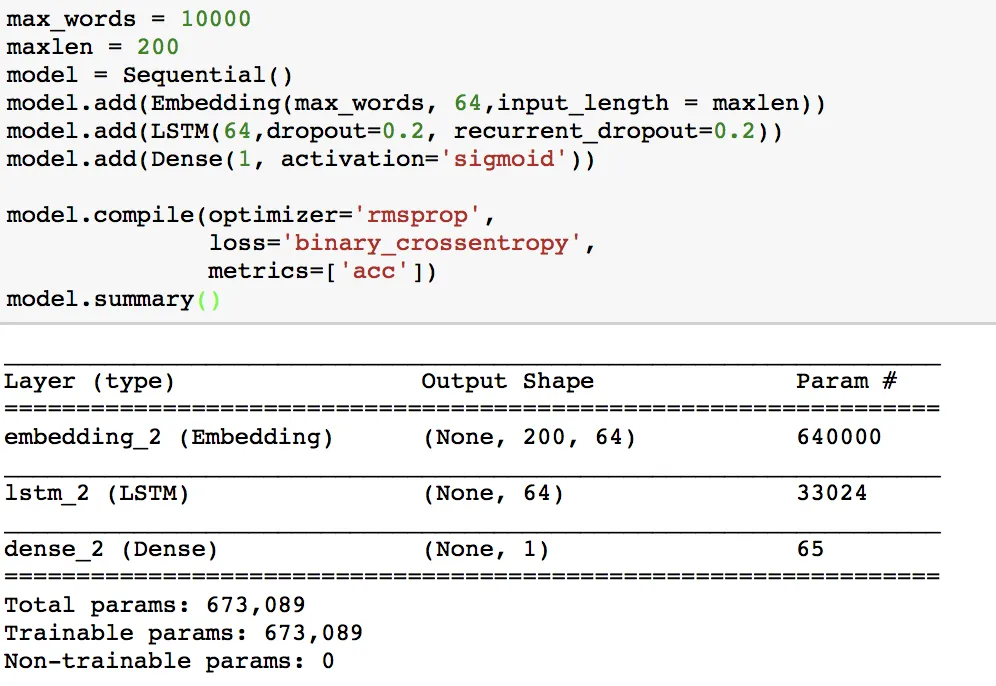

### 1D CNN on top of LSTM

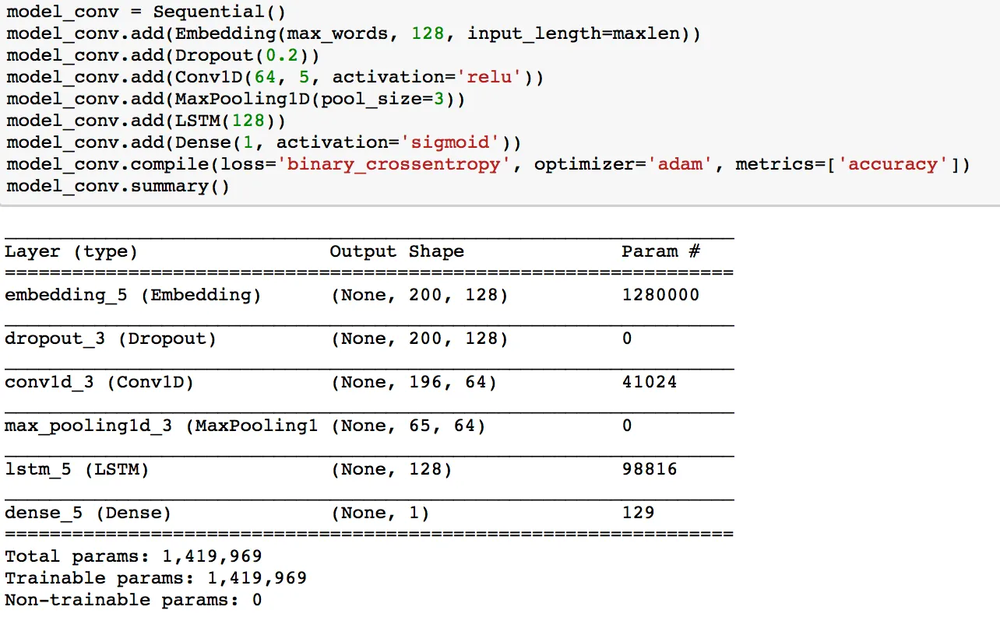

### LSTM with bidirectional layer

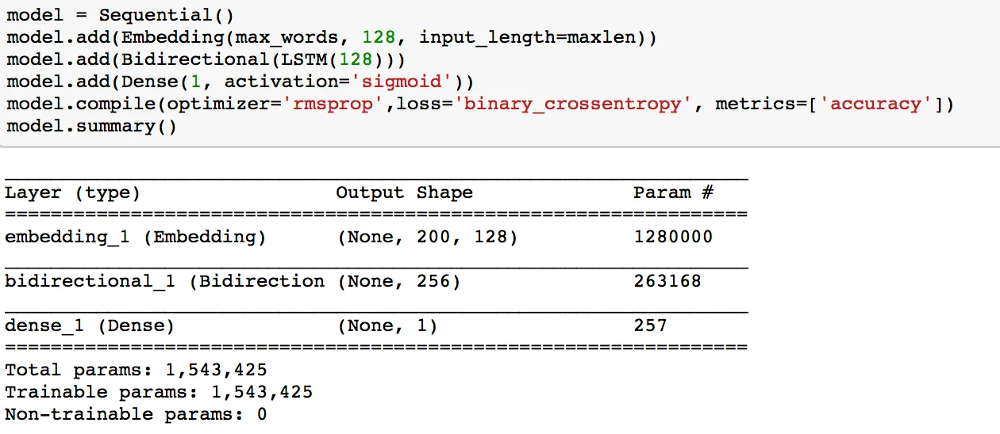

In [ ]:
###